In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
# load dataset and check data types
# Target is 'SalePrice'
df = pd.read_csv('/Users/kimian/Desktop/python/kaggle/house_price/inputs/train.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [7]:
df.shape

(1460, 81)

In [8]:
# Check How many Categorical Columns
categorical = [col for col in df.columns if df[col].dtypes == 'O']
print(f'There are {len(categorical)} Categorical Cols')


There are 43 Categorical Cols


/Users/kimian/opt/anaconda3/envs/ml/lib/python3.8/site-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)
/Users/kimian/opt/anaconda3/envs/ml/lib/python3.8/site-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)
/Users/kimian/opt/anaconda3/envs/ml/lib/python3.8/site-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interfa

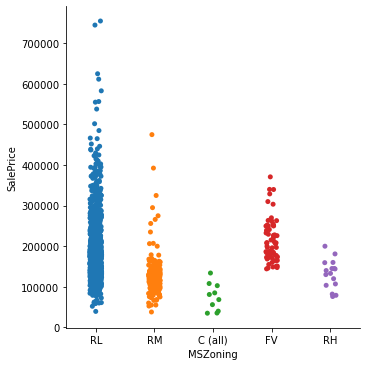

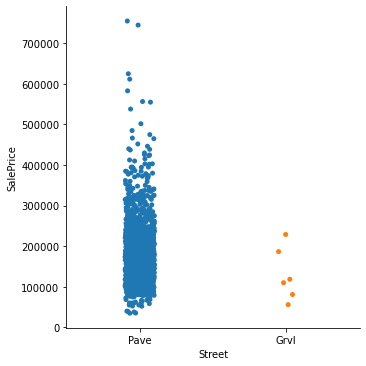

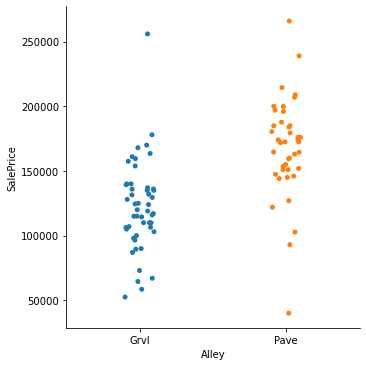

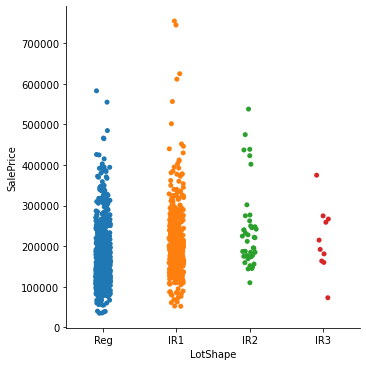

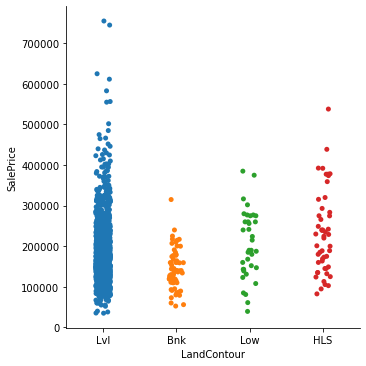

...

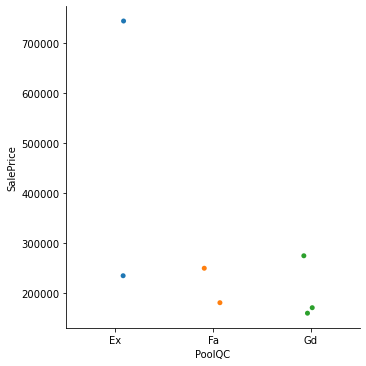

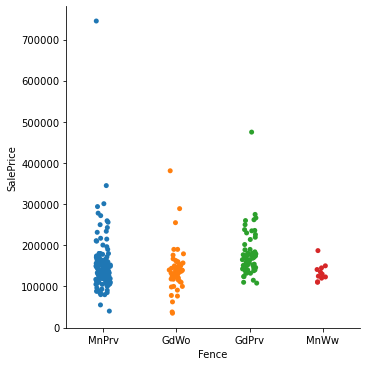

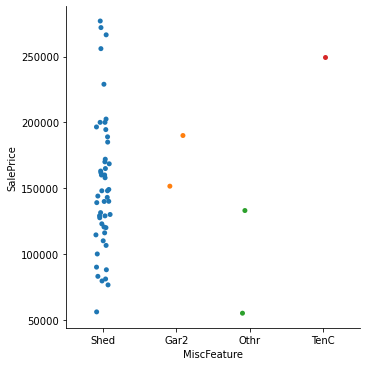

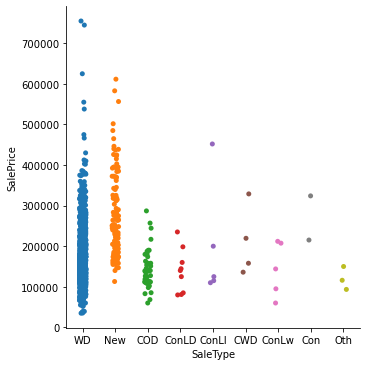

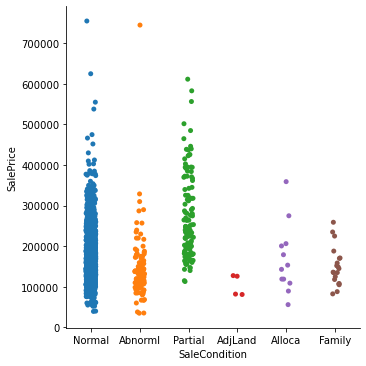

In [11]:
#Check How many Numerical Columns
for col in categorical:
    sns.catplot(x = col, y = 'SalePrice', data = df)

In [12]:
# Numeric and Years Column
numeric = [col for col in df.columns if df[col].dtype != 'O']
yr_var = [col for col in numeric if 'Yr' in col or 'Year' in col]

print(f'There are {len(numeric)} Numerical columns')
print(f'There are {len(yr_var)} Year columns')

There are 38 Numerical columns
There are 4 Year columns


In [13]:
df[yr_var].head()
# I am going to capture info of time of (YrSold - YearBuilt)

,YearBuilt,YearRemodAdd,GarageYrBlt,YrSold
0,2003,2003,2003.0,2008
1,1976,1976,1976.0,2007
2,2001,2002,2001.0,2008
3,1915,1970,1998.0,2006
4,2000,2000,2000.0,2008


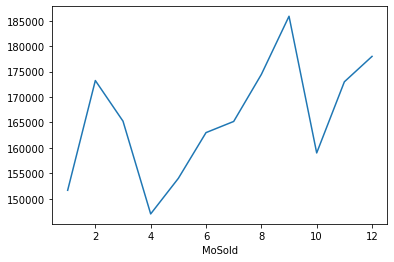

In [14]:
df.groupby('MoSold')['SalePrice'].median().plot()
# SalePrcie is vary depends on Month its sold

In [17]:
discrete_var = []
for col in numeric:
    if len(df[col].unique()) < 20 and col not in yr_var:
        print(f'{col} values:  {df[col].unique()}')
        discrete_var.append(col)

print(f'there are {len(discrete_var)} discrete col')

MSSubClass values:  [ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40]
OverallQual values:  [ 7  6  8  5  9  4 10  3  1  2]
OverallCond values:  [5 8 6 7 4 2 3 9 1]
BsmtFullBath values:  [1 0 2 3]
BsmtHalfBath values:  [0 1 2]
FullBath values:  [2 1 3 0]
HalfBath values:  [1 0 2]
BedroomAbvGr values:  [3 4 1 2 0 5 6 8]
KitchenAbvGr values:  [1 2 3 0]
TotRmsAbvGrd values:  [ 8  6  7  9  5 11  4 10 12  3  2 14]
Fireplaces values:  [0 1 2 3]
GarageCars values:  [2 3 1 0 4]
PoolArea values:  [  0 512 648 576 555 480 519 738]
MoSold values:  [ 2  5  9 12 10  8 11  4  1  7  3  6]
there are 14 discrete col


In [20]:
numeric = [col for col in numeric if col not in discrete_var and col not in ['Id', 'SalePrice'] and col not in yr_var]

print(f'There are {len(numeric)} numeric and continuous cols')

There are 18 numeric and continuous cols


In [21]:
# Check Missing Cols

for col in df.columns:
    if df[col].isna().sum() > 0:
        print(col, df[col].isna().mean())
        

LotFrontage 0.1773972602739726
Alley 0.9376712328767123
MasVnrType 0.005479452054794521
MasVnrArea 0.005479452054794521
BsmtQual 0.025342465753424658
BsmtCond 0.025342465753424658
BsmtExposure 0.026027397260273973
BsmtFinType1 0.025342465753424658
BsmtFinType2 0.026027397260273973
Electrical 0.0006849315068493151
FireplaceQu 0.4726027397260274
GarageType 0.05547945205479452
GarageYrBlt 0.05547945205479452
GarageFinish 0.05547945205479452
GarageQual 0.05547945205479452
GarageCond 0.05547945205479452
PoolQC 0.9952054794520548
Fence 0.8075342465753425
MiscFeature 0.963013698630137


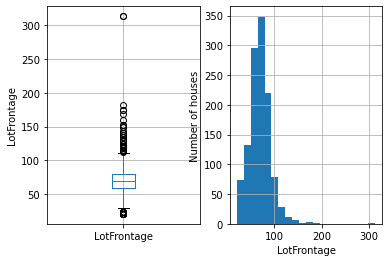

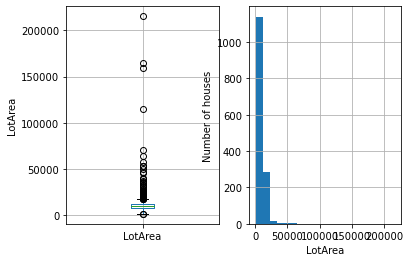

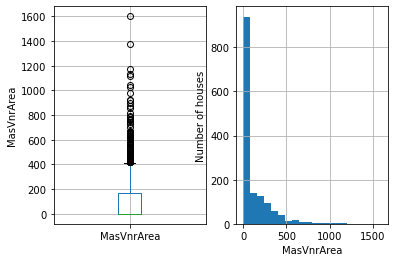

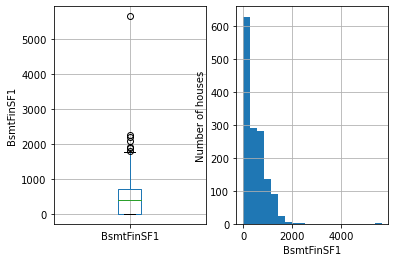

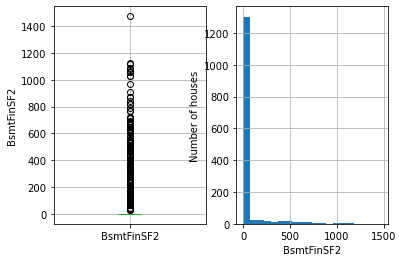

...

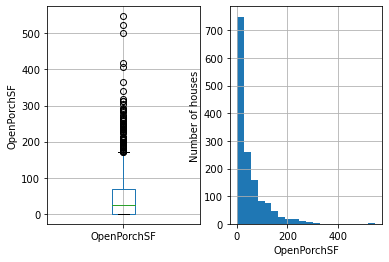

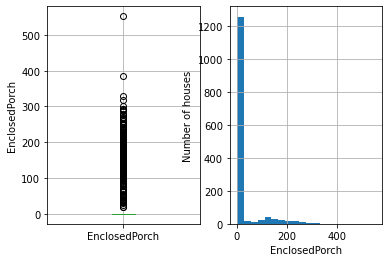

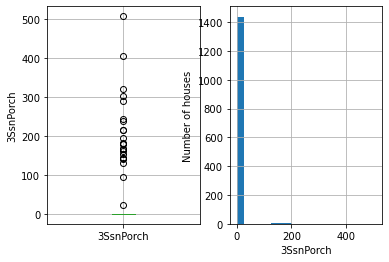

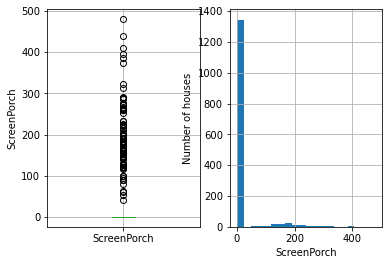

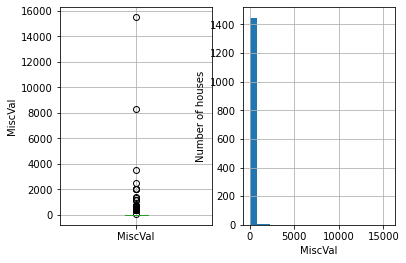

In [28]:
# Visualize Outliers and Distribution
# Diagnosis --> Outliers and not normal distribution
for var in numeric:
    plt.figure(figsize=(6,4))
    plt.subplot(1, 2, 1)
    fig = df.boxplot(column=var)
    fig.set_title('')
    fig.set_ylabel(var)
    
    plt.subplot(1, 2, 2)
    fig = df[var].hist(bins=20)
    fig.set_ylabel('Number of houses')
    fig.set_xlabel(var)

    plt.show()

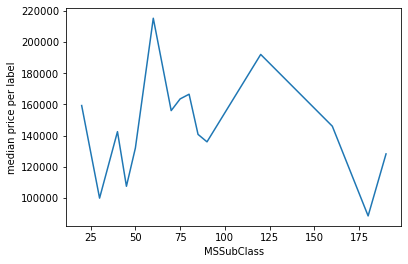

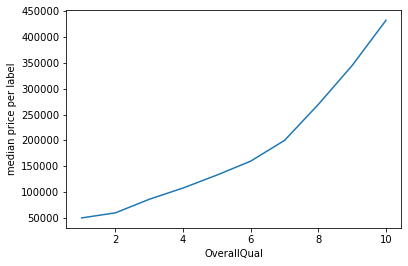

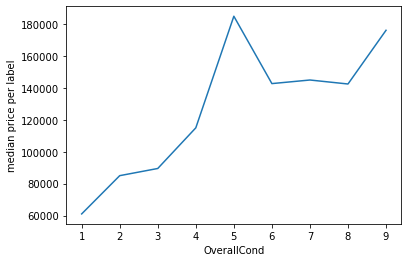

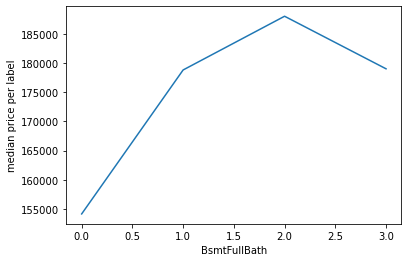

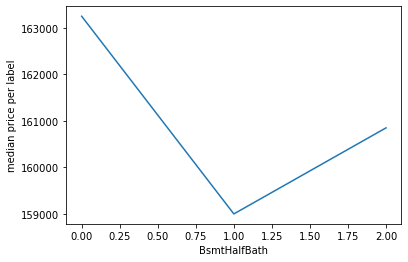

...

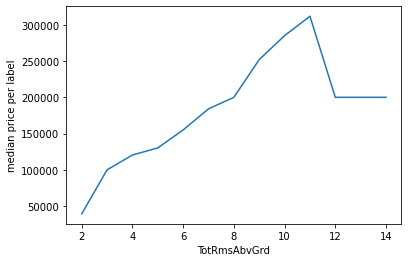

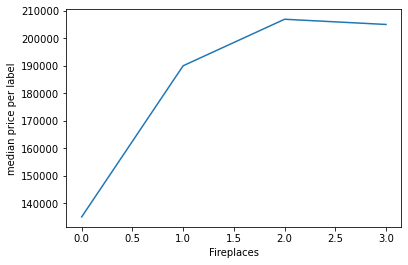

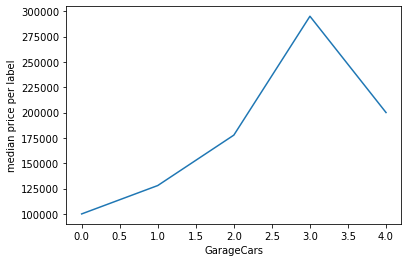

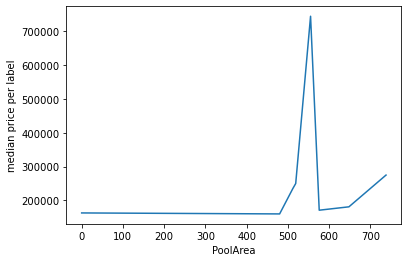

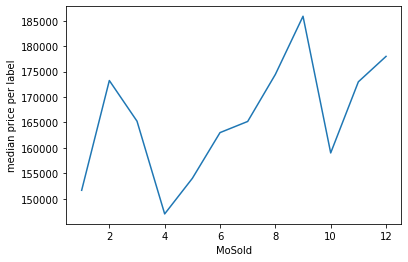

In [30]:
# check median sale price vs discrete
for var in discrete_var:
    df.groupby(var)['SalePrice'].median().plot()
    plt.ylabel('median price per label')
    plt.show()